<a href="https://colab.research.google.com/github/VishnuReddy25/OHRC/blob/main/Crater_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import kagglehub
lincolnzh_martianlunar_crater_detection_dataset_path = kagglehub.dataset_download('lincolnzh/martianlunar-crater-detection-dataset')

print('Data source import complete.')

100%|██████████| 74.0M/74.0M [00:03<00:00, 23.9MB/s]

Extracting files...


Data source import complete.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
print(lincolnzh_martianlunar_crater_detection_dataset_path)

/root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2


In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
from sklearn.model_selection import train_test_split

In [ ]:
# Paths
train_img_path = "/root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2/craters/train/images"
train_lbl_path = "/root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2/craters/train/labels"
valid_img_path = "/root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2/craters/valid/images"
valid_lbl_path = "/root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2/craters/valid/labels"
test_img_path = "/root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2/craters/test/images"
test_lbl_path = "/root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2/craters/test/labels"
model_path = "/root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2/best.pt"
data_yaml_path = "/content/drive/MyDrive/data.yaml"

In [ ]:
import os

print(len(os.listdir(train_img_path)))
print(len(os.listdir(valid_img_path)))
print(len(os.listdir(test_img_path)))

98
26
19


In [ ]:
# EDA and Data Preprocessing
def load_labels(label_path):
    label_files = os.listdir(label_path)
    data = []
    classes = set()
    for file in label_files:
        with open(os.path.join(label_path, file), 'r') as f:
            lines = f.readlines()
            for line in lines:
                parts = list(map(float, line.strip().split()))
                data.append([file, *parts])
                classes.add(int(parts[0]))
    df = pd.DataFrame(data, columns=['file', 'class', 'x_center', 'y_center', 'width', 'height'])
    return df, sorted(classes)

train_labels, train_classes = load_labels(train_lbl_path)
valid_labels, valid_classes = load_labels(valid_lbl_path)
test_labels, test_classes = load_labels(test_lbl_path)


In [ ]:
# Get all unique classes
all_classes = sorted(set(train_classes + valid_classes + test_classes))
class_names = [f'class_{i}' for i in all_classes]

In [ ]:
# Display first few rows of the labels
print("Train Labels")
display(train_labels.head())
print("\nValidation Labels")
display(valid_labels.head())
print("\nTest Labels")
display(test_labels.head())

Train Labels


,file,class,x_center,y_center,width,height
0,mars_crater--99-_jpg.rf.09682f4dbe2f52ffe89006...,0.0,0.514844,0.503906,0.141406,0.125781
1,mars_crater--34-_jpg.rf.5617051b3d6a801330f8d4...,0.0,0.536719,0.503906,0.874219,0.989844
2,09_png.rf.3b796e77a5f0036af4cd4413fcbe07a5.txt,0.0,0.275781,0.682813,0.086719,0.095312
3,09_png.rf.3b796e77a5f0036af4cd4413fcbe07a5.txt,0.0,0.932031,0.826562,0.079687,0.109375
4,09_png.rf.3b796e77a5f0036af4cd4413fcbe07a5.txt,0.0,0.747656,0.885156,0.088281,0.113281



Validation Labels


,file,class,x_center,y_center,width,height
0,mars_crater--92-_jpg.rf.608e45488b76786c69755a...,0.0,0.712500,0.676562,0.018750,0.024219
1,mars_crater--92-_jpg.rf.608e45488b76786c69755a...,0.0,0.788281,0.678125,0.021094,0.025000
2,mars_crater--92-_jpg.rf.608e45488b76786c69755a...,0.0,0.774219,0.976562,0.015625,0.021094
3,mars_crater--92-_jpg.rf.608e45488b76786c69755a...,0.0,0.591406,0.299219,0.020313,0.024219
4,mars_crater--92-_jpg.rf.608e45488b76786c69755a...,0.0,0.935156,0.032031,0.018750,0.023438



Test Labels


,file,class,x_center,y_center,width,height
0,019_png.rf.1930cd277f9bf0e3fa57f2dcfee0385f.txt,0.0,0.839063,0.157812,0.056250,0.051562
1,019_png.rf.1930cd277f9bf0e3fa57f2dcfee0385f.txt,0.0,0.896875,0.204687,0.075000,0.070312
2,019_png.rf.1930cd277f9bf0e3fa57f2dcfee0385f.txt,0.0,0.429688,0.281250,0.110937,0.082812
3,019_png.rf.1930cd277f9bf0e3fa57f2dcfee0385f.txt,0.0,0.535937,0.389062,0.107813,0.094531
4,019_png.rf.1930cd277f9bf0e3fa57f2dcfee0385f.txt,0.0,0.153125,0.417187,0.292187,0.285938


In [ ]:
# Create data.yaml
data_yaml_content = f"""
train: {train_img_path}
val: {valid_img_path}
test: {test_img_path}

nc: {len(all_classes)}  # number of classes
names: {class_names}  # class names
"""

with open(data_yaml_path, 'w') as f:
    f.write(data_yaml_content)

In [ ]:
# Plotting distribution of bounding box sizes
def plot_bounding_box_distribution(labels, title):
    labels['area'] = labels['width'] * labels['height']
    fig = px.histogram(labels, x='area', nbins=50, title=title)
    fig.show()

plot_bounding_box_distribution(train_labels, 'Train Bounding Box Area Distribution')
plot_bounding_box_distribution(valid_labels, 'Validation Bounding Box Area Distribution')
plot_bounding_box_distribution(test_labels, 'Test Bounding Box Area Distribution')

In [ ]:
# Image Preprocessing and Visualization
def visualize_sample_images(image_path, label_df, n_samples=5):
    image_files = os.listdir(image_path)[:n_samples]
    for img_file in image_files:
        img_path = os.path.join(image_path, img_file)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        fig, ax = plt.subplots(1, 1, figsize=(10, 10))
        ax.imshow(img)

        labels = label_df[label_df['file'] == img_file]
        for _, label in labels.iterrows():
            x_center = label['x_center'] * img.shape[1]
            y_center = label['y_center'] * img.shape[0]
            width = label['width'] * img.shape[1]
            height = label['height'] * img.shape[0]
            x_min = x_center - width / 2
            y_min = y_center - height / 2

            rect = plt.Rectangle(
                (x_min, y_min), width, height,
                edgecolor='red', facecolor='none', linewidth=2
            )
            ax.add_patch(rect)

        plt.title(f'Sample Image: {img_file}')
        plt.axis('off')
        plt.show()


In [ ]:
# YOLOv8 Model Training and Evaluation
!pip install -q ultralytics
from ultralytics import YOLO

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.4/887.4 kB 36.9 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
import os

# Create a new directory named 'my_directory'
os.makedirs('model', exist_ok=True)

Using device: cuda


100%|██████████| 6.25M/6.25M [00:00<00:00, 149MB/s]


engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, keras=False, optimize=False, int

100%|██████████| 755k/755k [00:00<00:00, 43.8MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 172MB/s]


AMP: checks passed ✅


train: Scanning /root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2/craters/train/labels... 98 images, 9 backgrounds, 0 corrupt: 100%|██████████| 98/98 [00:00<00:00, 1316.61it/s]

train: New cache created: /root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2/craters/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning:

A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.

val: Scanning /root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2/craters/valid/labels... 26 images, 2 backgrounds, 0 corrupt: 100%|██████████| 26/26 [00:00<00:00, 771.83it/s]

val: New cache created: /root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2/craters/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.39G      1.769      3.429      1.388         17        640: 100%|██████████| 7/7 [00:03<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]

                   all         26        202     0.0109      0.421     0.0606     0.0235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.28G      1.629      2.607      1.295         25        640: 100%|██████████| 7/7 [00:02<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

                   all         26        202     0.0167      0.644      0.139     0.0788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.36G       1.55      1.968      1.233         12        640: 100%|██████████| 7/7 [00:01<00:00,  4.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.46it/s]

                   all         26        202      0.021      0.812      0.256      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.38G      1.476      1.752      1.211          6        640: 100%|██████████| 7/7 [00:01<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.67it/s]

                   all         26        202     0.0213      0.822      0.336      0.191



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.37G      1.495      1.573      1.206         37        640: 100%|██████████| 7/7 [00:01<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

                   all         26        202      0.688      0.185      0.244      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.37G      1.482      1.531      1.229         19        640: 100%|██████████| 7/7 [00:01<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

                   all         26        202      0.289     0.0495      0.113     0.0655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.21G      1.527      1.921      1.287          7        640: 100%|██████████| 7/7 [00:02<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]

                   all         26        202      0.864      0.126      0.327       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.67G      1.508      1.508      1.214         19        640: 100%|██████████| 7/7 [00:02<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]

                   all         26        202      0.358     0.0743      0.205      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.28G      1.456      1.468      1.208         33        640: 100%|██████████| 7/7 [00:01<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

                   all         26        202      0.758      0.124      0.309      0.175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.26G      1.605      1.704      1.308          4        640: 100%|██████████| 7/7 [00:01<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

                   all         26        202      0.697       0.17      0.318      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.24G      1.555      1.583      1.268         10        640: 100%|██████████| 7/7 [00:01<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all         26        202      0.383      0.257      0.235      0.129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.29G      1.464      1.443       1.18         17        640: 100%|██████████| 7/7 [00:01<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]

                   all         26        202       0.43      0.354      0.337      0.181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.23G      1.432      1.519      1.201          6        640: 100%|██████████| 7/7 [00:01<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

                   all         26        202      0.259       0.33      0.221      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.32G      1.625      1.661      1.316          5        640: 100%|██████████| 7/7 [00:02<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]

                   all         26        202      0.511      0.465      0.438      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.37G      1.484      1.445      1.202         14        640: 100%|██████████| 7/7 [00:01<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

                   all         26        202      0.481      0.499      0.476      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.22G      1.448      1.306      1.227         21        640: 100%|██████████| 7/7 [00:01<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

                   all         26        202      0.443      0.485      0.391      0.196



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.35G       1.45      1.399      1.192         19        640: 100%|██████████| 7/7 [00:01<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

                   all         26        202      0.352      0.448      0.305      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.28G      1.404      1.326      1.185         23        640: 100%|██████████| 7/7 [00:01<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

                   all         26        202      0.365      0.535      0.336      0.175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.21G      1.456      1.295       1.22         14        640: 100%|██████████| 7/7 [00:02<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

                   all         26        202      0.461       0.55      0.512      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.37G      1.321      1.287      1.193          7        640: 100%|██████████| 7/7 [00:02<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

                   all         26        202      0.576      0.505      0.547      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.29G      1.426      1.243       1.19         15        640: 100%|██████████| 7/7 [00:01<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

                   all         26        202      0.572      0.579      0.575      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.29G      1.401      1.255      1.167         12        640: 100%|██████████| 7/7 [00:01<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

                   all         26        202       0.62      0.615      0.614      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.25G      1.379      1.397      1.227          3        640: 100%|██████████| 7/7 [00:01<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

                   all         26        202      0.648      0.574      0.597      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.33G      1.429      1.335      1.162         23        640: 100%|██████████| 7/7 [00:01<00:00,  4.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.22it/s]

                   all         26        202      0.673      0.594      0.614      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.36G      1.314      1.174      1.137         14        640: 100%|██████████| 7/7 [00:02<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

                   all         26        202      0.673        0.6      0.618      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.35G      1.276      1.104      1.142         18        640: 100%|██████████| 7/7 [00:02<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

                   all         26        202      0.673      0.629      0.642      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.31G      1.424      1.248      1.154         23        640: 100%|██████████| 7/7 [00:01<00:00,  4.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.88it/s]

                   all         26        202      0.578      0.644      0.637      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.38G      1.365      1.283      1.097         12        640: 100%|██████████| 7/7 [00:01<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.48it/s]

                   all         26        202      0.687      0.566      0.618      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.27G      1.379      1.256      1.155         15        640: 100%|██████████| 7/7 [00:01<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

                   all         26        202      0.698      0.594      0.619      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.36G      1.358       1.19      1.213          6        640: 100%|██████████| 7/7 [00:01<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.92it/s]

                   all         26        202      0.685      0.574      0.651      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.27G      1.287      1.127      1.138          9        640: 100%|██████████| 7/7 [00:02<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

                   all         26        202      0.612      0.629       0.65      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.22G      1.298      1.084      1.136         24        640: 100%|██████████| 7/7 [00:02<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]

                   all         26        202      0.619      0.604      0.616      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.39G      1.266      1.101      1.084         36        640: 100%|██████████| 7/7 [00:01<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.51it/s]

                   all         26        202      0.666       0.55      0.602      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50       2.4G      1.262      1.064      1.123         21        640: 100%|██████████| 7/7 [00:01<00:00,  5.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

                   all         26        202      0.601      0.624      0.617      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.38G      1.272      1.058      1.094         11        640: 100%|██████████| 7/7 [00:01<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

                   all         26        202       0.64      0.589      0.628      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.21G      1.394      1.193      1.161         11        640: 100%|██████████| 7/7 [00:01<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

                   all         26        202      0.586      0.638      0.623       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.34G      1.195     0.9752      1.096         13        640: 100%|██████████| 7/7 [00:02<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all         26        202      0.597       0.61      0.608      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.27G      1.311      1.047      1.075         36        640: 100%|██████████| 7/7 [00:02<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

                   all         26        202      0.616      0.624      0.597      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.26G      1.141     0.9485       1.04         25        640: 100%|██████████| 7/7 [00:01<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.40it/s]

                   all         26        202      0.647      0.609      0.604      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.28G      1.276      1.126      1.114         11        640: 100%|██████████| 7/7 [00:01<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.90it/s]

                   all         26        202      0.693      0.599      0.663      0.367


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.39G      1.316      1.208      1.107         19        640: 100%|██████████| 7/7 [00:02<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

                   all         26        202      0.683      0.609      0.667      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.28G      1.295      1.099      1.163          4        640: 100%|██████████| 7/7 [00:01<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]

                   all         26        202      0.643      0.624      0.648      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.24G      1.235      1.074      1.117         16        640: 100%|██████████| 7/7 [00:02<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

                   all         26        202      0.648      0.599      0.643      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.26G      1.243      1.167      1.131          5        640: 100%|██████████| 7/7 [00:02<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

                   all         26        202      0.677      0.624      0.659      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.29G      1.181     0.9838      1.031         23        640: 100%|██████████| 7/7 [00:01<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.54it/s]

                   all         26        202       0.65      0.634      0.662       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.29G      1.301      1.158      1.053         12        640: 100%|██████████| 7/7 [00:01<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.54it/s]

                   all         26        202      0.665      0.638      0.664      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.28G      1.194      1.044      1.086          8        640: 100%|██████████| 7/7 [00:01<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.43it/s]

                   all         26        202      0.655      0.657       0.67      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.32G      1.149      1.002      1.052          9        640: 100%|██████████| 7/7 [00:01<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

                   all         26        202       0.65      0.658      0.682      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.22G      1.164     0.9687      1.061         22        640: 100%|██████████| 7/7 [00:01<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

                   all         26        202      0.633      0.678      0.685      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.28G      1.167     0.9172      1.044         22        640: 100%|██████████| 7/7 [00:02<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

                   all         26        202      0.647      0.663       0.68      0.366



50 epochs completed in 0.047 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.34 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.77it/s]


                   all         26        202      0.634      0.678      0.685      0.369
Speed: 0.2ms preprocess, 2.7ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/train
Ultralytics 8.3.34 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2/craters/valid/labels.cache... 26 images, 2 backgrounds, 0 corrupt: 100%|██████████| 26/26 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.45it/s]


                   all         26        202      0.628      0.673      0.679      0.372
Speed: 0.3ms preprocess, 11.9ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to runs/detect/train2

image 1/1 /root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2/craters/test/images/mars_crater--33-_jpg.rf.baf9c7be01ba1f4b954e0e5be0560c80.jpg: 640x640 (no detections), 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


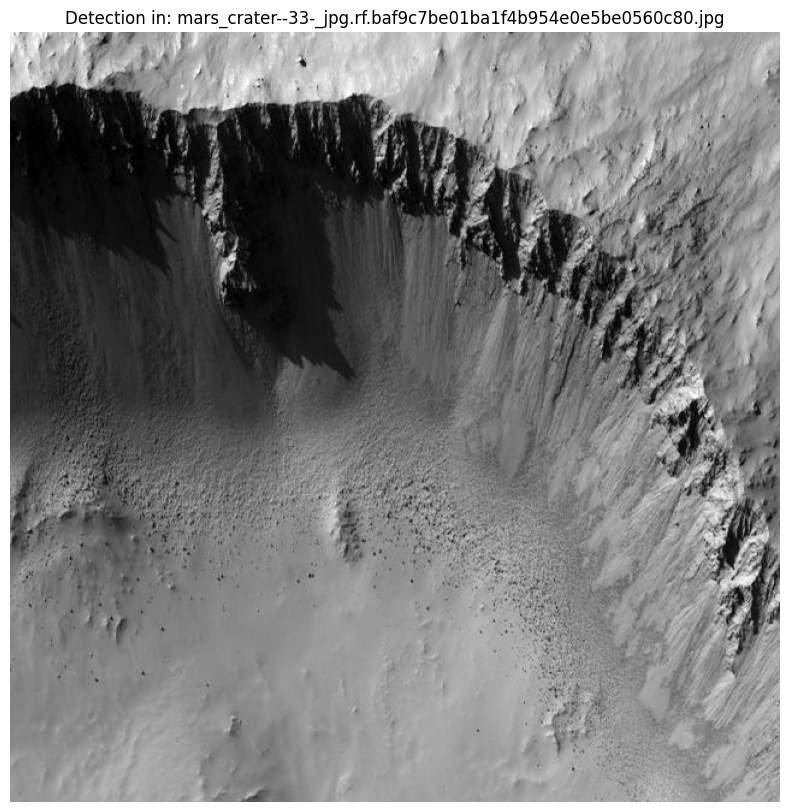


image 1/1 /root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2/craters/test/images/mars_crater--66-_jpg.rf.85564f58f27e684c94c8a0e484cc289e.jpg: 640x640 1 class_0, 15.7ms
Speed: 2.4ms preprocess, 15.7ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


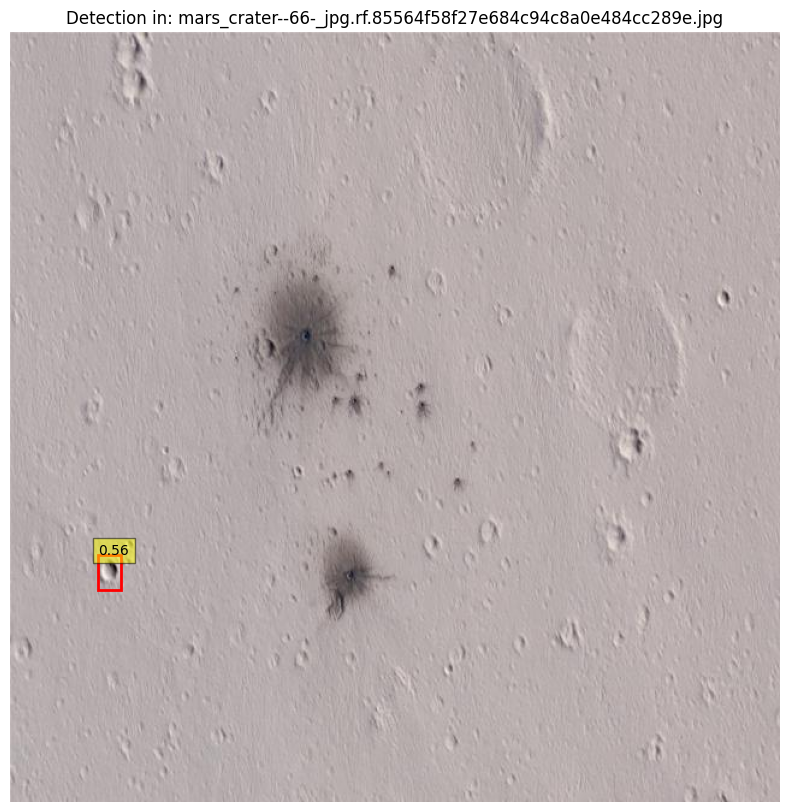


image 1/1 /root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2/craters/test/images/mars_crater--108-_jpg.rf.9395f473f249e064dbfea078e2519a17.jpg: 640x640 15 class_0s, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


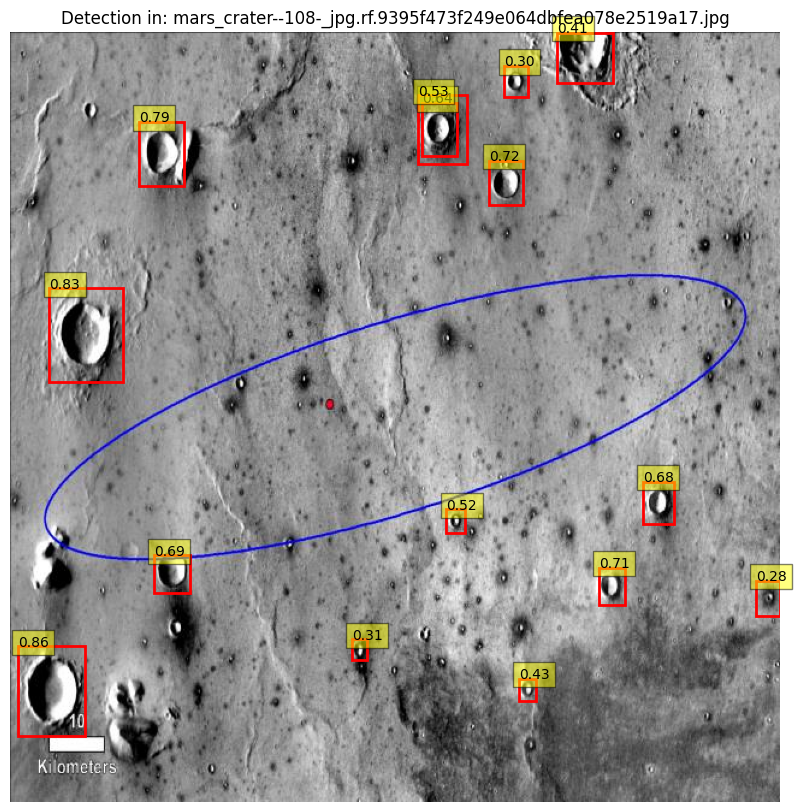


image 1/1 /root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2/craters/test/images/mars_crater--117-_jpg.rf.b412b6593d102c5f9dda7bce79bb815c.jpg: 640x640 10 class_0s, 9.7ms
Speed: 2.2ms preprocess, 9.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


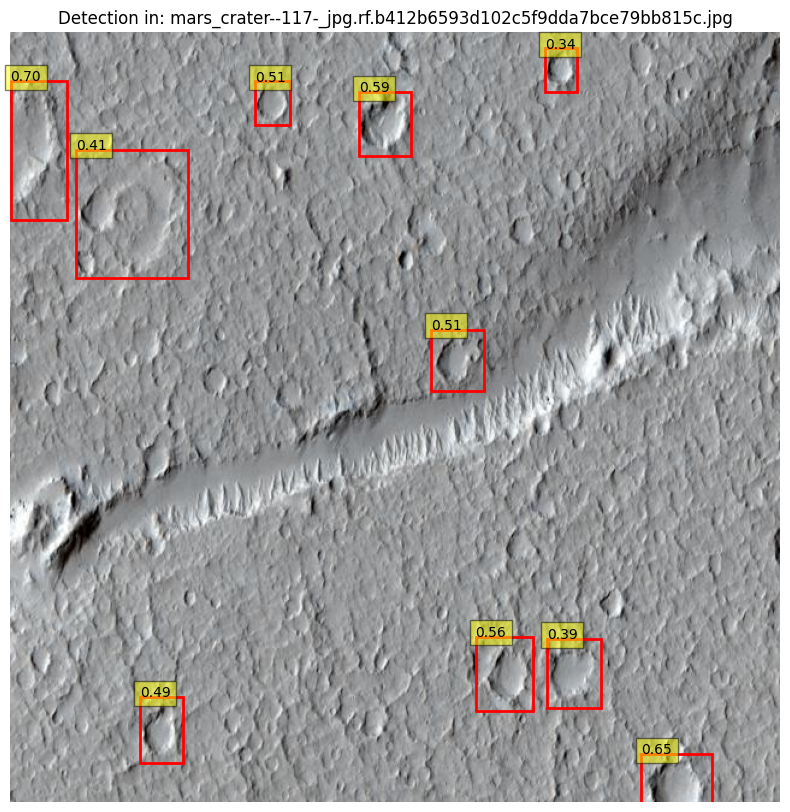


image 1/1 /root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2/craters/test/images/04_png.rf.81a7d6cbeb9dc09e5a8ecd40e185fc92.jpg: 640x640 15 class_0s, 16.8ms
Speed: 2.4ms preprocess, 16.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


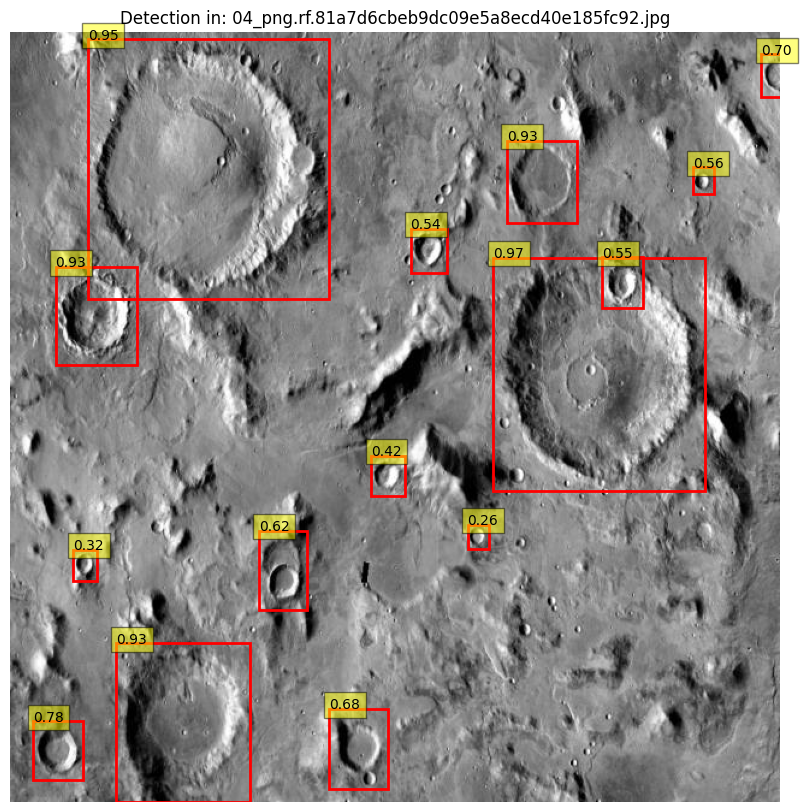


image 1/1 /root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2/craters/test/images/mars_crater--46-_jpg.rf.369e88a43859f97a595d2091746600f4.jpg: 640x640 2 class_0s, 12.2ms
Speed: 2.3ms preprocess, 12.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


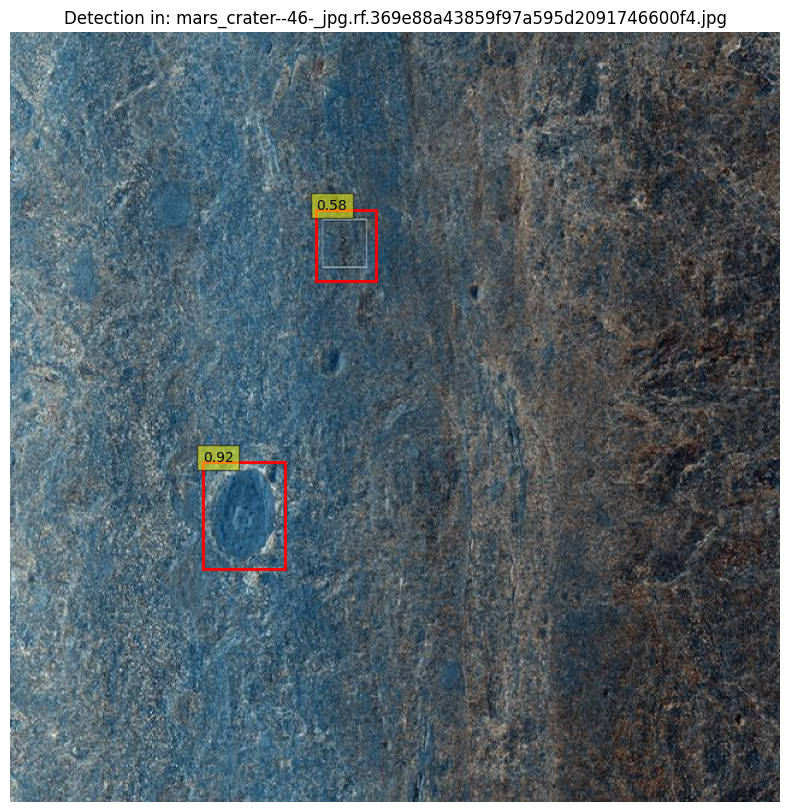


image 1/1 /root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2/craters/test/images/mars_crater--116-_jpg.rf.2e550a693a8800808e68848484716b95.jpg: 640x640 5 class_0s, 9.7ms
Speed: 2.5ms preprocess, 9.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


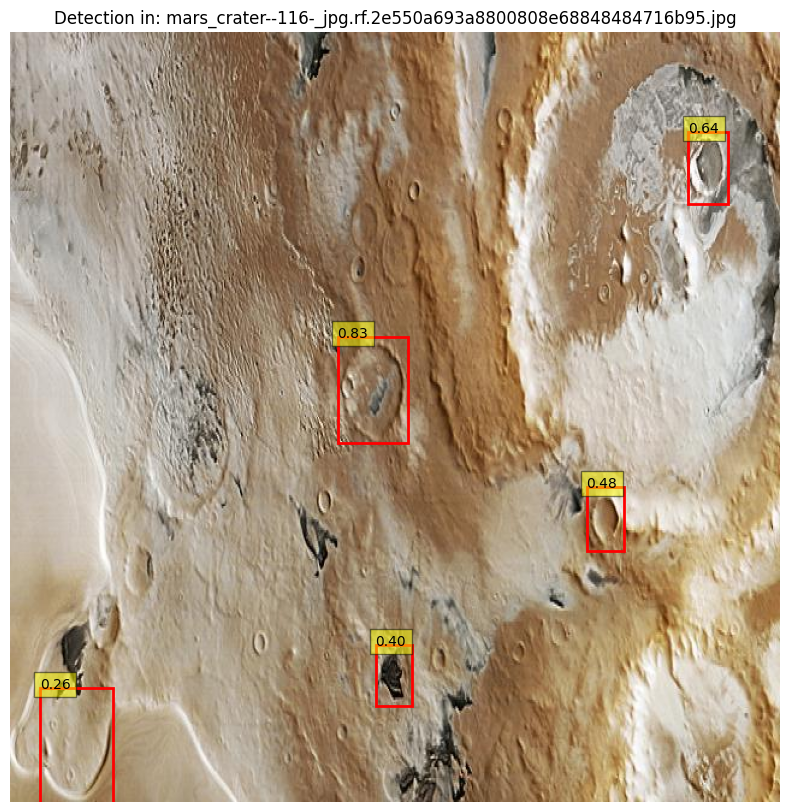


image 1/1 /root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2/craters/test/images/mars_crater--97-_jpg.rf.63347c2ec963cf5c4ab641e1ba872df1.jpg: 640x640 5 class_0s, 13.5ms
Speed: 2.3ms preprocess, 13.5ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


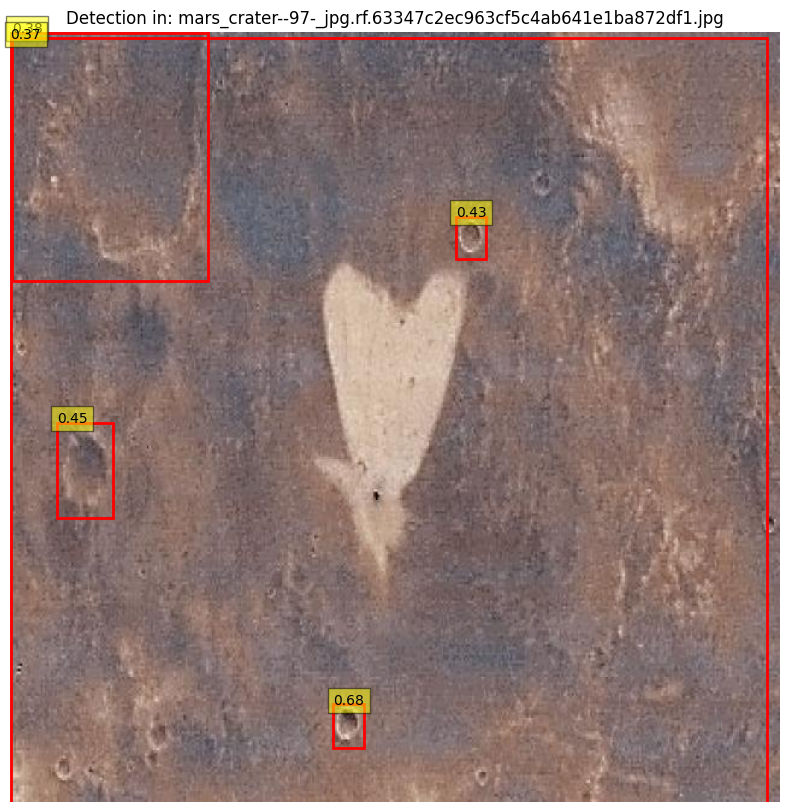


image 1/1 /root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2/craters/test/images/019_png.rf.1930cd277f9bf0e3fa57f2dcfee0385f.jpg: 640x640 7 class_0s, 11.2ms
Speed: 2.3ms preprocess, 11.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


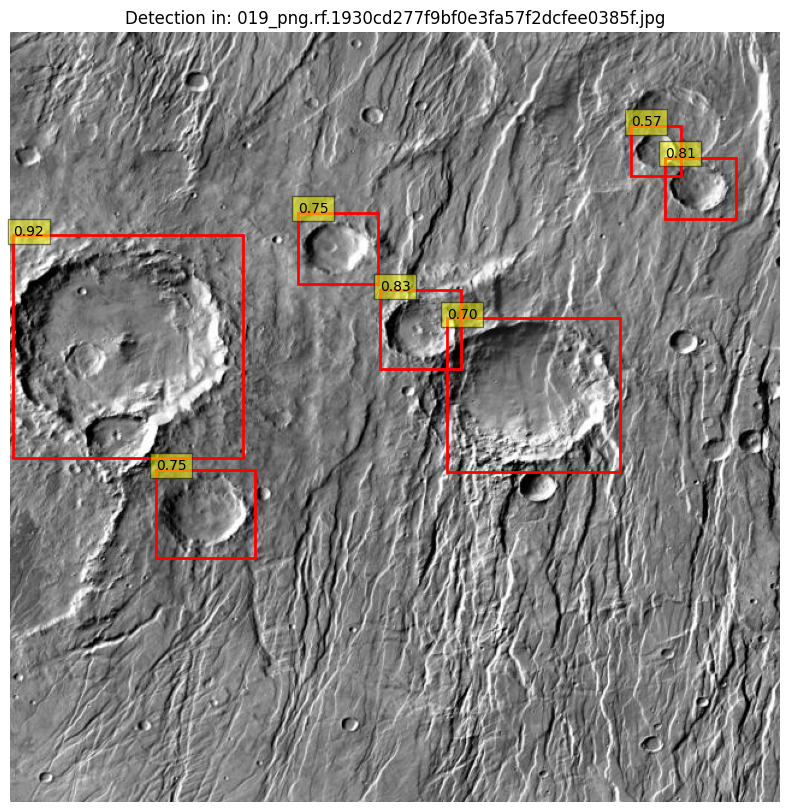


image 1/1 /root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2/craters/test/images/mars_crater--25-_jpg.rf.a06bfa24b404b064ead471f56d636e0e.jpg: 640x640 3 class_0s, 12.7ms
Speed: 2.3ms preprocess, 12.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


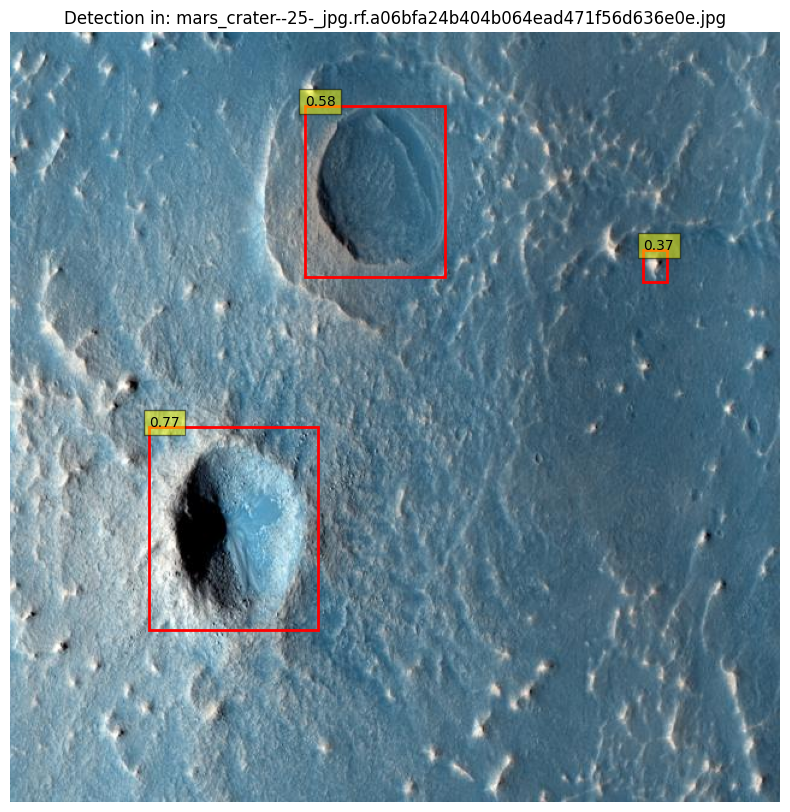

Model training, evaluation, and sample visualization completed. The trained model is saved at /content/model/best_model.pt'.


In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import torch
from ultralytics import YOLO

# Check if CUDA is available and set the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
# Load the model and move it to the device
model = YOLO('yolov8n.pt').to(device)
# Train the model on the device
model.train(data=data_yaml_path, epochs=50, device=device)
# Evaluate the model
results = model.val()
# Save the trained model
model.save('/content/model/best_model.pt')
# Visualize ample detections
def visualize_detections(model, image_path, n_samples=10):
    image_files = os.listdir(image_path)[:n_samples]
    for img_file in image_files:
        img_path = os.path.join(image_path, img_file)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Perform inference on the device
        results = model(img_path, device=device)

        fig, ax = plt.subplots(1, 1, figsize=(10, 10))
        ax.imshow(img)

        for result in results[0].boxes:
            x_min, y_min, x_max, y_max = result.xyxy[0].cpu().numpy()
            conf = result.conf[0].cpu().item()
            rect = plt.Rectangle(
                (x_min, y_min), x_max - x_min, y_max - y_min,
                edgecolor='red', facecolor='none', linewidth=2
            )
            ax.add_patch(rect)
            ax.text(
                x_min, y_min, f'{conf:.2f}',
                bbox=dict(facecolor='yellow', alpha=0.5)
            )
        plt.title(f'Detection in: {img_file}')
        plt.axis('off')
        plt.show()

# Call the visualization function
visualize_detections(model, test_img_path)

print("Model training, evaluation, and sample visualization completed. The trained model is saved at /content/model/best_model.pt'.")


In [ ]:
# Load the trained YOLO model and fine-tune it
model = YOLO('/content/model/best_model.pt')

# Fine-tune with more epochs and possibly a lower learning rate
model.train(data=data_yaml_path, epochs=20, lr0=0.0001, device=device)

# Evaluate the fine-tuned model
results = model.val()

# Save the fine-tuned model
model.save('/content/model/fine_tuned_model.pt')


engine/trainer: task=detect, mode=train, model=/content/model/best_model.pt, data=/content/drive/MyDrive/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, keras=False, 

train: Scanning /root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2/craters/train/labels.cache... 98 images, 9 backgrounds, 0 corrupt: 100%|██████████| 98/98 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2/craters/valid/labels.cache... 26 images, 2 backgrounds, 0 corrupt: 100%|██████████| 26/26 [00:00<?, ?it/s]


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train3
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      2.42G      2.357      2.154      1.772         17        640: 100%|██████████| 7/7 [00:02<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

                   all         26        202      0.412      0.124     0.0964     0.0352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      2.27G      1.942      1.708       1.64         25        640: 100%|██████████| 7/7 [00:03<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

                   all         26        202      0.155     0.0842     0.0564      0.024



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      2.35G      1.772      1.514      1.509         12        640: 100%|██████████| 7/7 [00:02<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

                   all         26        202      0.198     0.0514     0.0539     0.0238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      2.37G      1.662      1.427      1.433          6        640: 100%|██████████| 7/7 [00:01<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.24it/s]

                   all         26        202      0.281     0.0644     0.0632     0.0278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      2.36G      1.586      1.298      1.326         37        640: 100%|██████████| 7/7 [00:01<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.54it/s]

                   all         26        202      0.293      0.114      0.115     0.0555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      2.36G      1.624      1.259      1.329         19        640: 100%|██████████| 7/7 [00:01<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.19it/s]

                   all         26        202       0.34      0.198      0.179     0.0983



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20       2.2G      1.612      1.586      1.357          7        640: 100%|██████████| 7/7 [00:01<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

                   all         26        202      0.634      0.342      0.388      0.217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      2.66G      1.492      1.259      1.239         19        640: 100%|██████████| 7/7 [00:02<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]

                   all         26        202      0.749      0.406      0.498      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      2.26G      1.402      1.185      1.216         33        640: 100%|██████████| 7/7 [00:02<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]

                   all         26        202      0.763      0.495      0.568      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      2.25G      1.487      1.284      1.266          4        640: 100%|██████████| 7/7 [00:02<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]

                   all         26        202      0.771      0.516      0.593      0.324


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      2.26G      1.491      1.338      1.263          8        640: 100%|██████████| 7/7 [00:03<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

                   all         26        202      0.725      0.515      0.587      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      2.25G      1.517      1.412      1.299          3        640: 100%|██████████| 7/7 [00:01<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.57it/s]

                   all         26        202      0.685      0.545        0.6      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      2.24G      1.451      1.257       1.19         26        640: 100%|██████████| 7/7 [00:01<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.24it/s]

                   all         26        202      0.697      0.559      0.609      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      2.23G      1.411      1.229      1.175         17        640: 100%|██████████| 7/7 [00:02<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         26        202      0.699      0.529      0.636      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      2.27G      1.448      1.228      1.199         16        640: 100%|██████████| 7/7 [00:02<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all         26        202       0.72       0.52      0.638      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20       2.2G      1.369      1.143      1.189         11        640: 100%|██████████| 7/7 [00:02<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.06it/s]

                   all         26        202       0.72      0.549      0.657      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      2.25G      1.442       1.19      1.238         19        640: 100%|██████████| 7/7 [00:01<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

                   all         26        202      0.698      0.554       0.66      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      2.28G      1.547      1.157      1.219         17        640: 100%|██████████| 7/7 [00:01<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.66it/s]

                   all         26        202      0.639      0.594       0.66      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      2.26G      1.381      3.172      1.067          1        640: 100%|██████████| 7/7 [00:01<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

                   all         26        202      0.675      0.609      0.671      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      2.33G      1.406      1.162      1.151         12        640: 100%|██████████| 7/7 [00:01<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

                   all         26        202      0.708      0.609      0.677      0.381



20 epochs completed in 0.027 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 6.2MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics 8.3.34 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.61it/s]


                   all         26        202      0.705      0.609      0.677       0.38
Speed: 0.2ms preprocess, 2.4ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to runs/detect/train3
Ultralytics 8.3.34 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /root/.cache/kagglehub/datasets/lincolnzh/martianlunar-crater-detection-dataset/versions/2/craters/valid/labels.cache... 26 images, 2 backgrounds, 0 corrupt: 100%|██████████| 26/26 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.60it/s]


                   all         26        202      0.707      0.609      0.678      0.381
Speed: 0.4ms preprocess, 5.4ms inference, 0.0ms loss, 4.0ms postprocess per image
Results saved to runs/detect/train32


In [ ]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

In [ ]:
!pip install transformers
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 25.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 17.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 19.5 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


In [ ]:
import torch
from transformers import DetrForObjectDetection, DetrImageProcessor
from datasets import load_dataset

# Load the pre-trained DETR model
detr_model = DetrForObjectDetection.from_pretrained('facebook/detr-resnet-50')
processor = DetrImageProcessor.from_pretrained('facebook/detr-resnet-50')

# Fine-tune on your dataset
# Assuming you have the images and annotations formatted correctly
# You will need to prepare the dataset to match the COCO format
def detr_fine_tune(images, annotations):
    inputs = processor(images=images, annotations=annotations, return_tensors="pt")
    outputs = detr_model(**inputs)

    loss = outputs.loss
    loss.backward()

    # Perform optimizer step, etc.
    # Fine-tuning loop here...

# Save the fine-tuned DETR model
detr_model.save_pretrained('/content/model/detr_fine_tuned')


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning:


The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.



config.json:   0%|          | 0.00/4.59k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


preprocessor_config.json:   0%|          | 0.00/290 [00:00<?, ?B/s]

Using device: cuda


Saving moon.jpg to moon.jpg

image 1/1 /content/moon.jpg: 640x640 26 class_0s, 9.0ms
Speed: 1.7ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


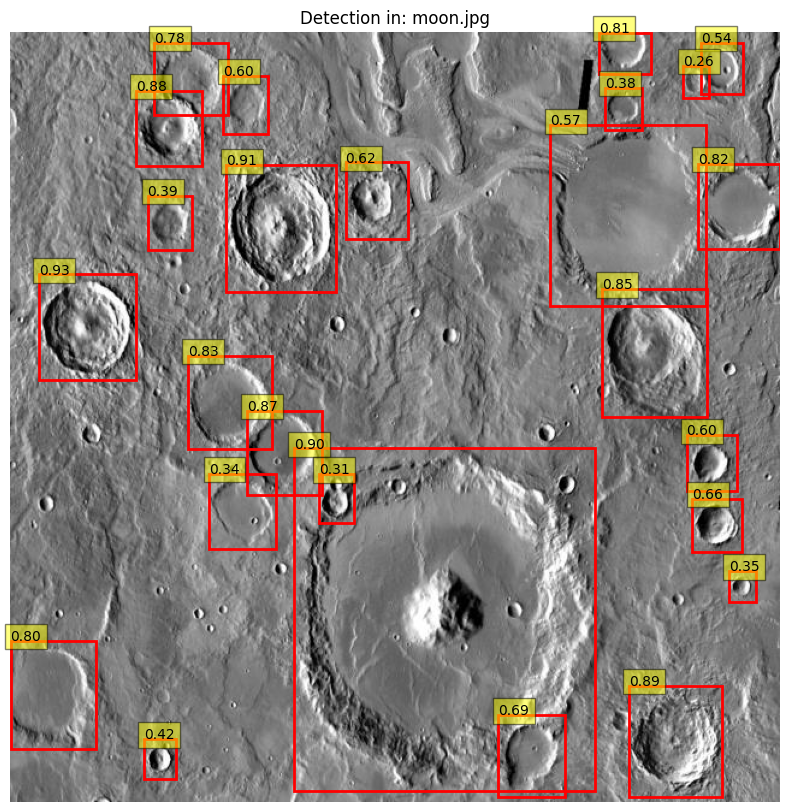

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
from google.colab import files
from IPython.display import display, Image
from ultralytics import YOLO
import torch

# Check if CUDA is available and set the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Load your trained YOLO model
model = YOLO('/content/model/best_model.pt').to(device)  # Or fine_tuned_model.pt

# Function to handle image upload and crater detection
def detect_craters_in_uploaded_image():
    uploaded = files.upload()
    for filename in uploaded.keys():
        img_path = filename

        # Run inference on the device
        results = model(img_path, device=device)

        # Visualize predictions
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        fig, ax = plt.subplots(1, 1, figsize=(10, 10))
        ax.imshow(img)

        for result in results[0].boxes:
            x_min, y_min, x_max, y_max = result.xyxy[0].cpu().numpy()
            conf = result.conf[0].cpu().item()
            rect = plt.Rectangle(
                (x_min, y_min), x_max - x_min, y_max - y_min,
                edgecolor='red', facecolor='none', linewidth=2
            )
            ax.add_patch(rect)
            ax.text(
                x_min, y_min, f'{conf:.2f}',
                bbox=dict(facecolor='yellow', alpha=0.5)
            )

        plt.title(f'Detection in: {filename}')
        plt.axis('off')
        plt.show()

# Call the function to start the process
detect_craters_in_uploaded_image()

Using device: cuda


Saving moon.jpg to moon (1).jpg

image 1/1 /content/moon (1).jpg: 640x640 26 class_0s, 9.0ms
Speed: 2.4ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


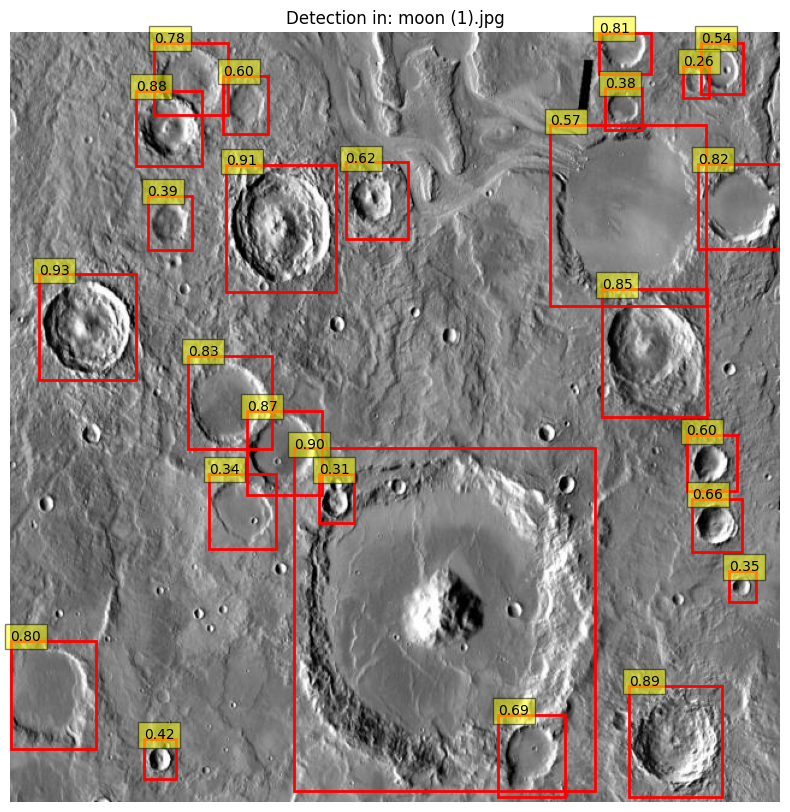

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
from google.colab import files
from IPython.display import display, Image
from ultralytics import YOLO
import torch

# Check if CUDA is available and set the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Load your trained YOLO model
model = YOLO('/content/model/best_model.pt').to(device)  # Or fine_tuned_model.pt

# Function to handle image upload and crater detection
def detect_craters_in_uploaded_image():
    uploaded = files.upload()
    for filename in uploaded.keys():
        img_path = filename

        # Run inference on the device
        results = model(img_path, device=device)

        # Visualize predictions
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        fig, ax = plt.subplots(1, 1, figsize=(10, 10))
        ax.imshow(img)

        for result in results[0].boxes:
            x_min, y_min, x_max, y_max = result.xyxy[0].cpu().numpy()
            conf = result.conf[0].cpu().item()
            rect = plt.Rectangle(
                (x_min, y_min), x_max - x_min, y_max - y_min,
                edgecolor='red', facecolor='none', linewidth=2
            )
            ax.add_patch(rect)
            ax.text(
                x_min, y_min, f'{conf:.2f}',
                bbox=dict(facecolor='yellow', alpha=0.5)
            )

        plt.title(f'Detection in: {filename}')
        plt.axis('off')
        plt.show()

# Call the function to start the process
detect_craters_in_uploaded_image()